# RetinaNet

**RetinaNet** is an object detection model designed to address the challenge of detecting objects at varying scales, including small objects, within an image. It introduces the novel Focal Loss to handle class imbalance and improve accuracy.

### - Key Components

1. **Feature Pyramid Network (FPN):**
   - RetinaNet uses FPN to create a pyramid of feature maps at different scales, enabling the detection of objects at various sizes.

2. **Anchor Boxes:**
   - The model utilizes anchor boxes of different scales and aspect ratios at each pyramid level, facilitating the handling of objects of diverse sizes.

3. **Object Classification:**
   - RetinaNet predicts the probability of object presence and class for each anchor box using a classification subnet.

4. **Bounding Box Regression:**
   - The model performs bounding box regression to refine the anchor boxes and improve localization accuracy.

5. **Focal Loss:**
   - To address class imbalance inherent in object detection, RetinaNet introduces Focal Loss, which down-weights easy examples and focuses on hard examples, improving the model's ability to learn from challenging cases.

6. **Post-processing:**
   - Non-maximum suppression is applied to filter out redundant and overlapping predictions, ensuring only the most confident and accurate detections are retained.

### - Advantages

- **Handling Scale Variation:** RetinaNet excels at detecting objects of different scales within an image, including small objects that might be challenging for other detectors.

- **Focal Loss for Imbalanced Data:** The introduction of Focal Loss helps mitigate the impact of class imbalance, improving the model's ability to focus on challenging instances.

- **State-of-the-Art Performance:** RetinaNet achieves state-of-the-art performance on benchmark datasets, making it a reliable choice for accurate object detection.

In summary, RetinaNet's combination of FPN, anchor boxes, and Focal Loss addresses key challenges in object detection, making it a robust and effective model for a wide range of applications.

# -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- --
## Training setup

### 1. GPU memory usage
Run this code lines to check CUDA and GPU memory availabilty

In [1]:
!nvidia-smi

Thu Jan 11 13:41:39 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.129.03             Driver Version: 535.129.03   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA RTX A6000               On  | 00000000:19:00.0 Off |                  Off |
| 30%   36C    P8              23W / 300W |     12MiB / 49140MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
# Check CUDA compiler
!nvcc -V

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0


### <em>Optional</em>
If you'd like to use a base a pretrained RetinaNet, you can uncomment the following line code

and change `load_from` variable in the config file [retinanet_hrplanesv2.py](./mmlab_configs/retinanet_hrplanesv2.py) from `None` to the path of the downloaded `.pth`

In [3]:
# !mim download mmdet --config ga-retinanet_r50-caffe_fpn_1x_coco --dest mmlab_configs

### Start training

you can start training Faster RCNN using this command line

In [ ]:
!python train.py mmlab_configs/retinanet_hrplanesv2.py

### Wait until the training finishes
if the training takes too long you can use in the terminal the command:

 ```nohup python train.py mmlab_configs/retinanet_hrplanesv2.py > retinanet_hrplanesv2.log &```

### Inference
To run the inference, execute the following command

In [3]:
!python image_inference.py inference_test/unseen output_tensor/retinanet/retinanet_hrplanesv2.py --weights output_tensor/retinanet/best.pth --out-dir inference_test/results/retinanet_inference --pred-score-thr 0.3

Loads checkpoint by local backend from path: output_tensor/retinanet/best.pth
01/11 13:45:51 - mmengine - WARNING - Failed to search registry with scope "mmdet" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmdet" is a correct scope, or whether the registry is initialized.
01/11 13:45:51 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
/home/safouane/.local/lib/python3.8/site-packages/mmengine/visualization/visuali━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.8 it/s  
zer.py:757: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may 
not be in the image
  warnings.warn(
/home/safouane/.local/lib/python3.8/site-packages/mmengine/visualization/visualim━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.8 it/s  
zer.py:828: UserWarning: Warning: The polygon is out of bounds, the drawn 
polygon may n

### Let's plot the results

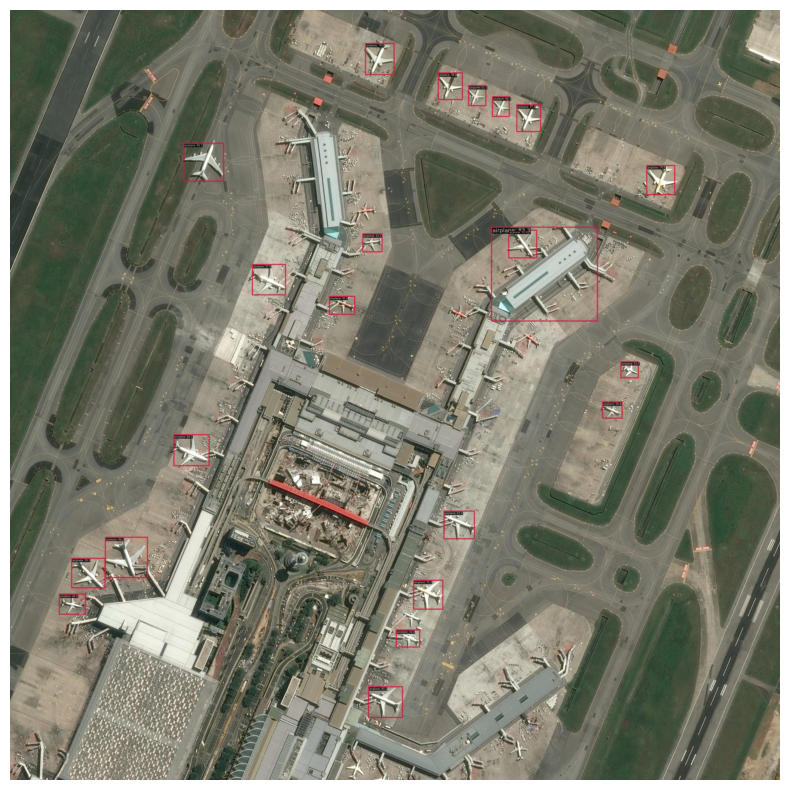

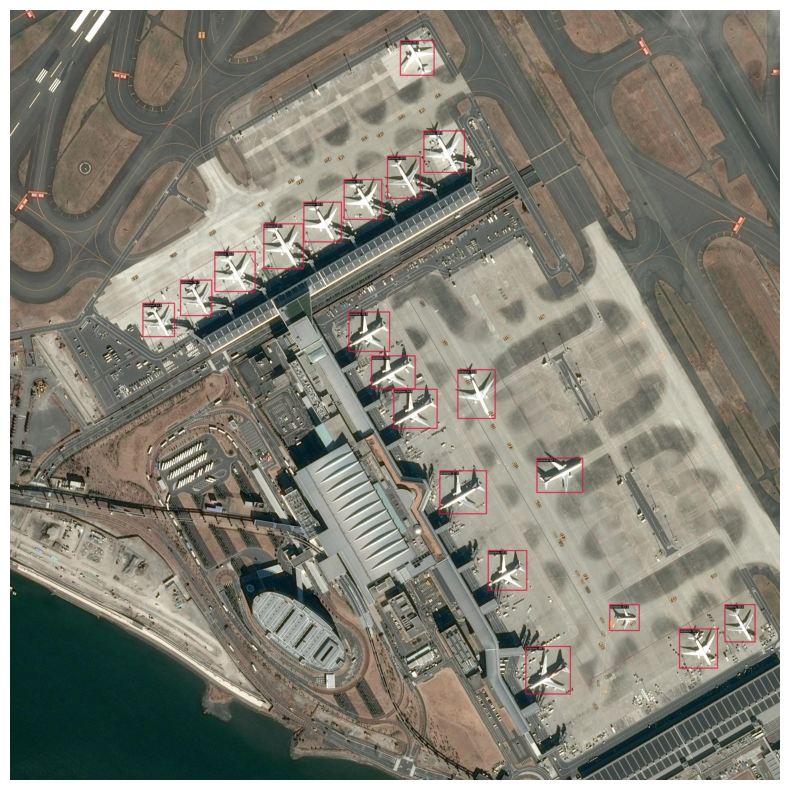

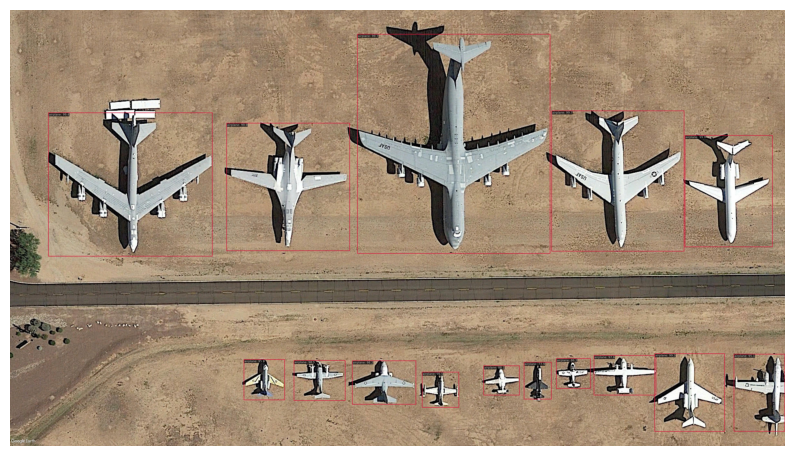

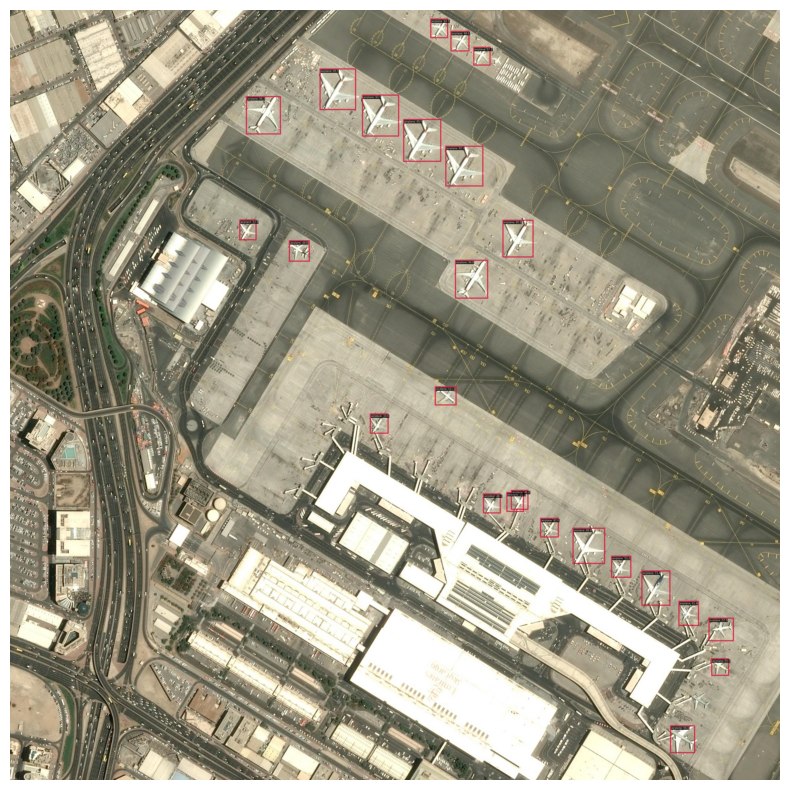

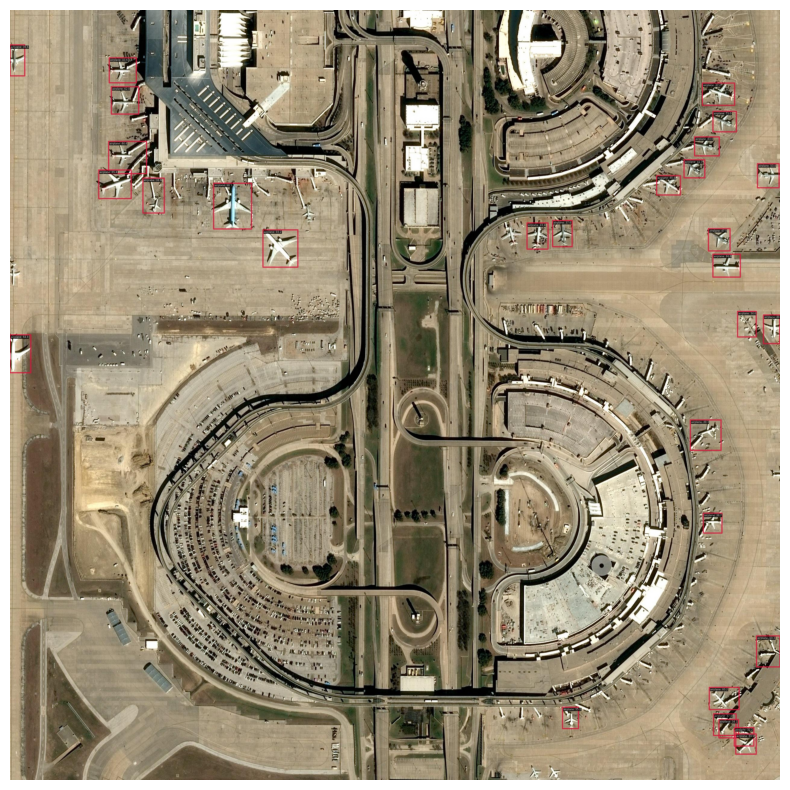

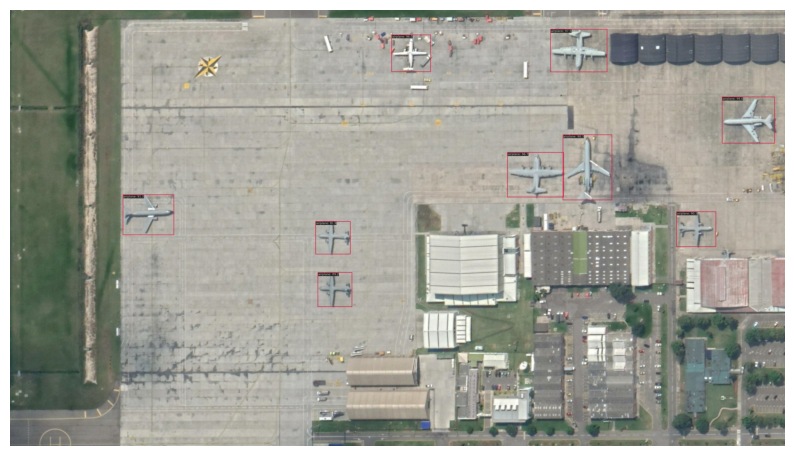

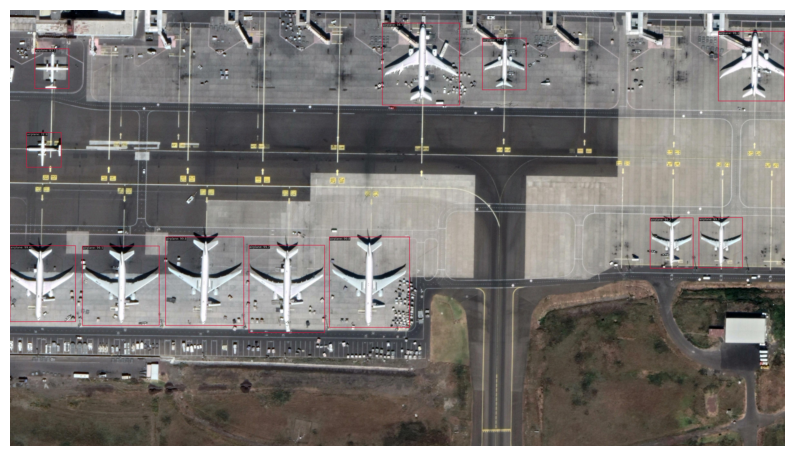

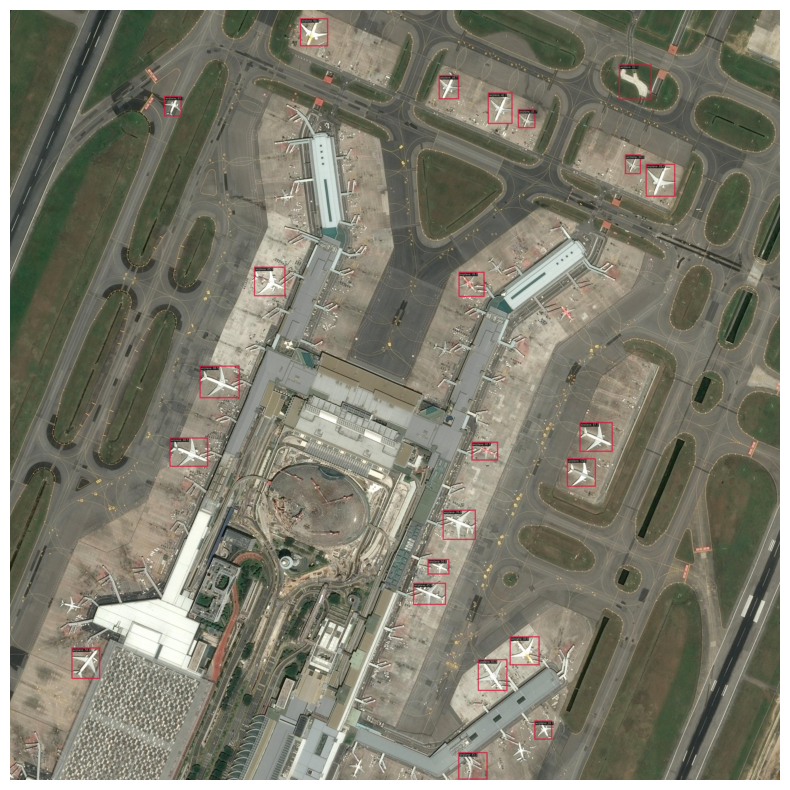

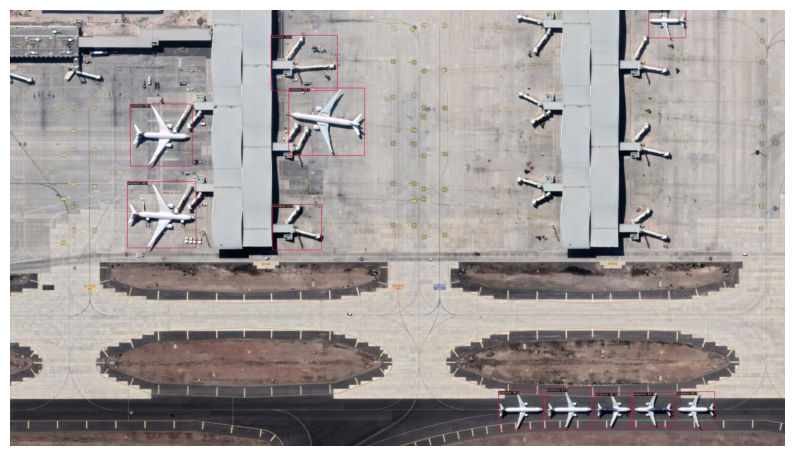

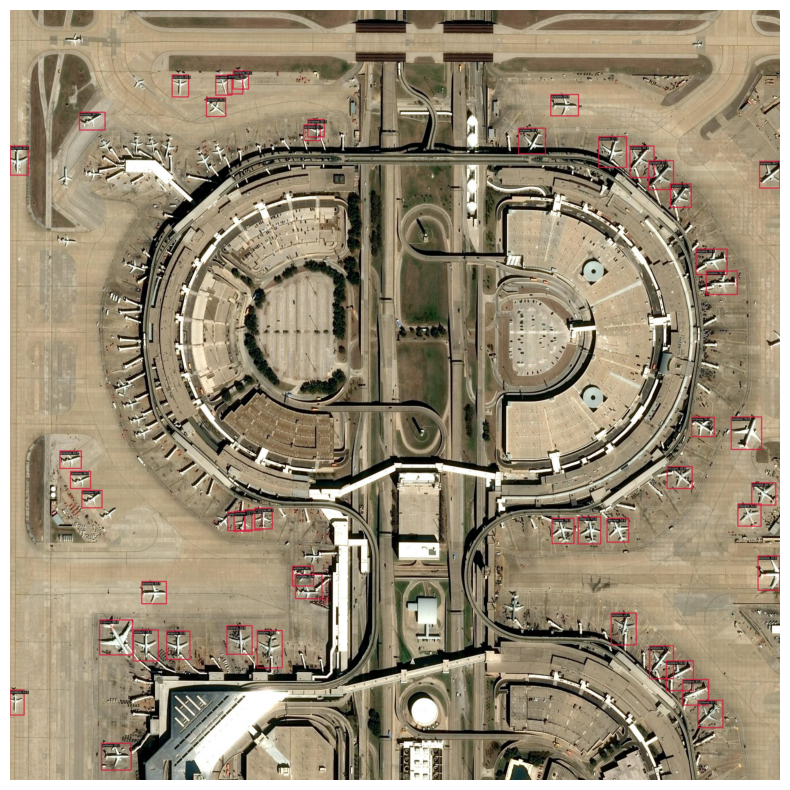

In [4]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Define the path to the directory containing the jpg images
path_to_images = './inference_test/results/retinanet_inference/vis'

# Iterate over each file in the directory
for file in os.listdir(path_to_images):
    # Check if the file is a jpg image
    if file.endswith('.jpg'):
        # Open the image using PIL
        img = Image.open(os.path.join(path_to_images, file))

        # Convert the image to an RGB format that matplotlib can understand
        img_rgb = img.convert('RGB')

        # Display the image using matplotlib
        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.axis('off')
        plt.show()

In [1]:
!python video_inference.py inference_test/videos/Barcelona_airport.mp4 output_tensor/retinanet/retinanet_hrplanesv2.py output_tensor/retinanet/best.pth --out inference_test/videos/Barcelona_airport_RetinaNet_inference.mp4

Loads checkpoint by local backend from path: output_tensor/retinanet/best.pth
01/11 14:55:53 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
[>>                              ] 36/449, 5.1 task/s, elapsed: 7s, ETA:    80s/home/safouane/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:757: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
/home/safouane/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:828: UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 449/449, 6.5 task/s, elapsed: 69s, ETA:     0s
